# 대회 개요

## 개요

COVID-19의 확산으로 우리나라는 물론 전 세계 사람들은 경제적, 생산적인 활동에 많은 제약을 가지게 되었습니다. 우리나라는 COVID-19 확산 방지를 위해 사회적 거리 두기를 단계적으로 시행하는 등의 많은 노력을 하고 있습니다. 과거 높은 사망률을 가진 사스(SARS)나 에볼라(Ebola)와는 달리 COVID-19의 치사율은 오히려 비교적 낮은 편에 속합니다. 그럼에도 불구하고, 이렇게 오랜 기간 동안 우리를 괴롭히고 있는 근본적인 이유는 바로 COVID-19의 강력한 전염력 때문입니다.

감염자의 입, 호흡기로부터 나오는 비말, 침 등으로 인해 다른 사람에게 쉽게 전파가 될 수 있기 때문에 감염 확산 방지를 위해 무엇보다 중요한 것은 모든 사람이 마스크로 코와 입을 가려서 혹시 모를 감염자로부터의 전파 경로를 원천 차단하는 것입니다. 이를 위해 공공 장소에 있는 사람들은 반드시 마스크를 착용해야 할 필요가 있으며, 무엇 보다도 코와 입을 완전히 가릴 수 있도록 올바르게 착용하는 것이 중요합니다. 하지만 넓은 공공장소에서 모든 사람들의 올바른 마스크 착용 상태를 검사하기 위해서는 추가적인 인적자원이 필요할 것입니다.

**따라서, 우리는 카메라로 비춰진 사람 얼굴 이미지 만으로 이 사람이 마스크를 쓰고 있는지, 쓰지 않았는지, 정확히 쓴 것이 맞는지 자동으로 가려낼 수 있는 시스템이 필요합니다.** 이 시스템이 공공장소 입구에 갖춰져 있다면 적은 인적자원으로도 충분히 검사가 가능할 것입니다.

## 데이터
- 전체 사람 명 수: 4,500  
*전체 데이터셋 중에서 60%는 학습 데이터셋으로 활용됩니다.*
- 한 사람당 사진의 개수: 7 [마스크 착용 5장, 이상하게 착용(코스크, 턱스크) 1장, 미착용 1장]
- 이미지 크기: (384, 512)  


## 결과값
- 총 18개의 class를 예측해야 합니다.
- Class Description: 마스크 착용 여부, 성별, 나이를 기준으로 총 18개의 클래스가 있습니다.
![](https://s3-ap-northeast-2.amazonaws.com/aistages-public-junyeop/app/Users/00000025/files/56bd7d05-4eb8-4e3e-884d-18bd74dc4864..png)

# EDA

## 필요 라이브러리 로드

In [13]:
import os
import numpy as np
import pandas as pd
import numpy as np
import warnings
from tqdm import tqdm

from PIL import Image

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.image as img
import seaborn as sns

warnings.filterwarnings('ignore')
tqdm.pandas()  # for progress_apply

mpl.rcParams['figure.dpi'] = 200
mpl.rcParams['axes.spines.top'] = False
mpl.rcParams['axes.spines.right'] = False


## 데이터 로드

In [2]:
df = pd.read_csv("input/data/train/train.csv")
df.sample(8)

,id,gender,race,age,path
1112,003051,female,Asian,20,003051_female_Asian_20
2309,006146,male,Asian,20,006146_male_Asian_20
1310,003329,female,Asian,19,003329_female_Asian_19
1117,003056,female,Asian,20,003056_female_Asian_20
2340,006212,male,Asian,19,006212_male_Asian_19
2191,005481,female,Asian,39,005481_female_Asian_39
374,000829,female,Asian,55,000829_female_Asian_55
1028,001842,male,Asian,23,001842_male_Asian_23


- 이미지 확인

In [3]:
def image_path_loader(image_path:str) -> list:
    '''image_path에 해당하는 이미지 주소값들을 담은 리스트 반환'''

    image_dir = "/opt/ml/input/data/train/images/" + image_path
    image_names = sorted(os.listdir(image_dir))
    images = list()
    for image in image_names:
        if image.startswith('.'):
            continue
        images.append(image_dir + '/' + image)
    
    return images


def image_printer(image_path:str) -> None:
    '''image_path에 대한 이미지들을 출력'''

    images = image_path_loader(image_path)
    
    fig, axes = plt.subplots(1, len(images), figsize=(20, 8))
    plt.subplots_adjust(wspace=0)
    axes.flatten()
    for i in range(len(images)):
        image = img.imread(images[i])
        axes[i].imshow(image)
        axes[i].axis('off')
        if i == len(images) // 2:
            axes[i].set_title(image_path, fontweight='bold', fontsize = 20)

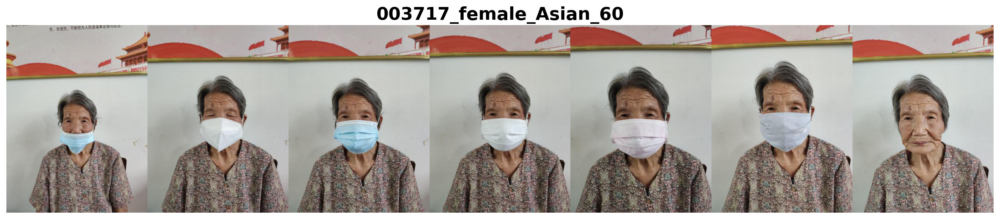

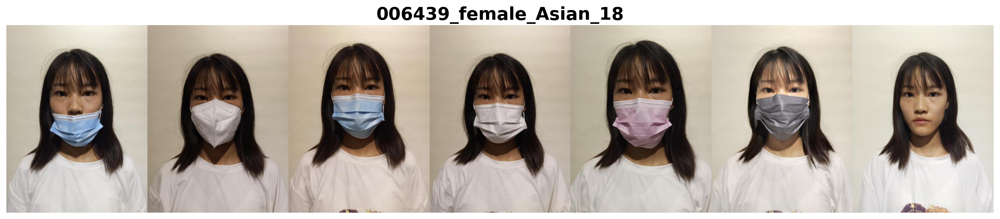

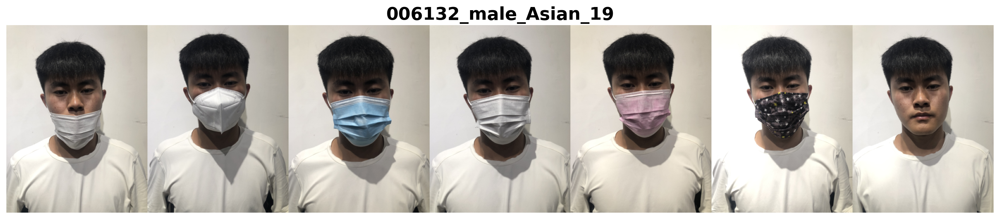

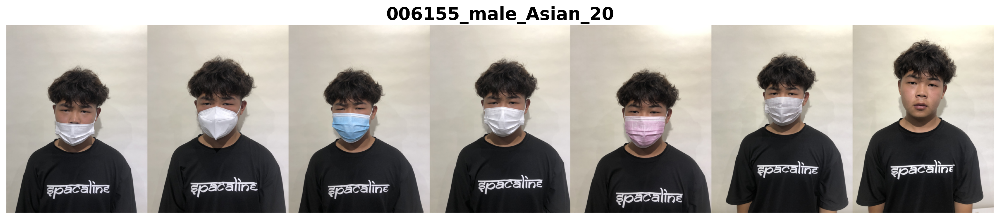

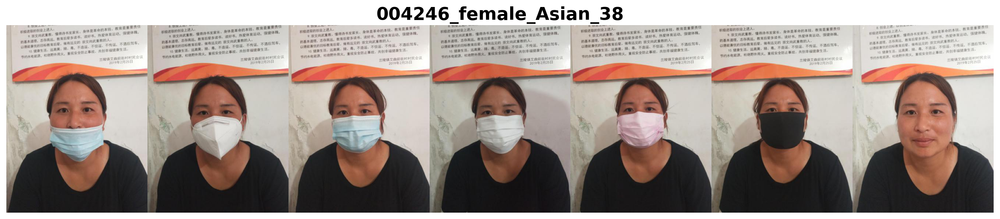

In [5]:
n = 5
for img_path in list(df.sample(n).path):
    image_printer(img_path)
    

## 전체적인 data 확인

In [33]:
# 전체적인 data 확인

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2700 entries, 0 to 2699
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      2700 non-null   object
 1   gender  2700 non-null   object
 2   race    2700 non-null   object
 3   age     2700 non-null   int64 
 4   path    2700 non-null   object
dtypes: int64(1), object(4)
memory usage: 105.6+ KB


In [18]:
# 이미지 크기 확인

imgs = image_path_loader(df.sample(1).path.values[0])
for img in imgs:
    img = Image.open(img)
    print(np.array(img).shape)


(512, 384, 3)
(512, 384, 3)
(512, 384, 3)
(512, 384, 3)
(512, 384, 3)
(512, 384, 3)
(512, 384, 3)


In [34]:
# null값 확인

df.isnull().sum()

id        0
gender    0
race      0
age       0
path      0
dtype: int64

In [35]:
# 통계치 확인

df.describe(include = 'all')

,id,gender,race,age,path
count,2700,2700,2700,2700.000000,2700
unique,2699,2,1,NaN,2700
top,003397,female,Asian,NaN,003329_female_Asian_19
freq,2,1658,2700,NaN,1
mean,NaN,NaN,NaN,37.708148,NaN
std,NaN,NaN,NaN,16.985904,NaN
min,NaN,NaN,NaN,18.000000,NaN
25%,NaN,NaN,NaN,20.000000,NaN
50%,NaN,NaN,NaN,36.000000,NaN
75%,NaN,NaN,NaN,55.000000,NaN


- id가 같은 값이 있음을 확인 -> 출력해서 확인!!

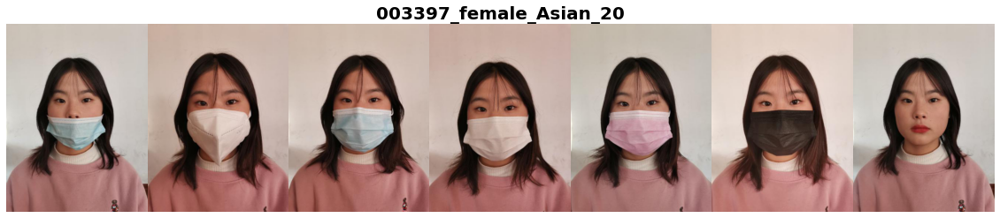

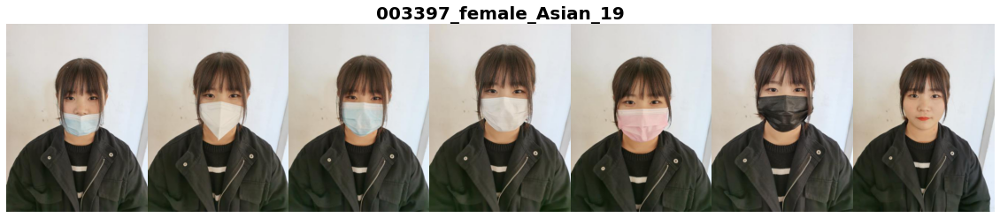

In [141]:
for image in df.path[df.id == '003397'].values:
    image_printer(image)

-> id는 같지만 다른 사람인 것을 확인함

## feature들에 대한 EDA

### mask

하나의 폴더는 여러가지 종류의 마스크를 쓴 사진 5장, 이상하게 쓴 사진 1장, 안 쓴 사진 1장으로 구성되어 있다고 함
-> 마스크(wear) : 마스크(incorrect) : 마스크(not wear) = 5 : 1 : 1

### gender

Text(1, 942, '1042')

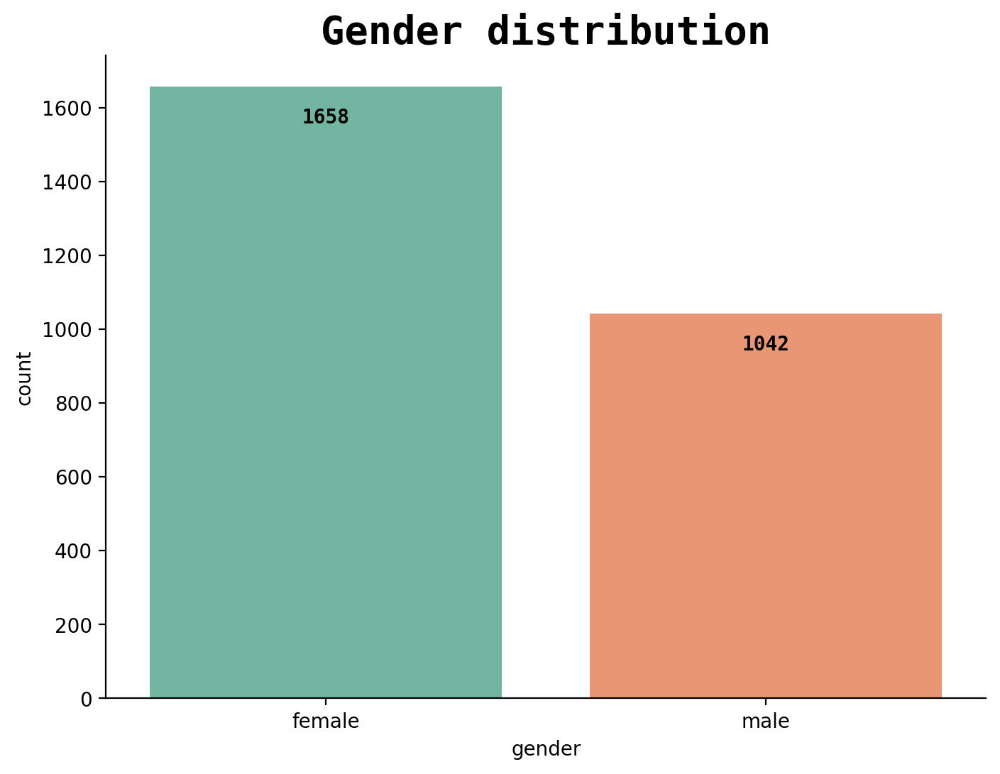

In [42]:
fig, ax = plt.subplots(figsize = (8, 6))
ax.set_title('Gender distribution', fontweight='bold', fontsize = 20, fontfamily='monospace')
sns.countplot(x='gender',data=df,
              palette='Set2', ax = ax)
ax.text(x =0 , y = df.gender.value_counts().female - 100,
         s = df.gender.value_counts().female, 
         ha='center', fontweight='bold', fontfamily='monospace')
ax.text(x =1 , y = df.gender.value_counts().male - 100,
         s = df.gender.value_counts().male, 
         ha='center', fontweight='bold', fontfamily='monospace')


In [36]:
gender_f_m = round(df.gender.value_counts().female / df.gender.value_counts().male, 2)

print(f'여성의 데이터가 남성의 데이터에 비해 {gender_f_m}배 더 많은 것을 알 수 있음')

여성의 데이터가 남성의 데이터에 비해 1.59배 더 많은 것을 알 수 있음


### age

age의 전체적인 분포를 확인해보자

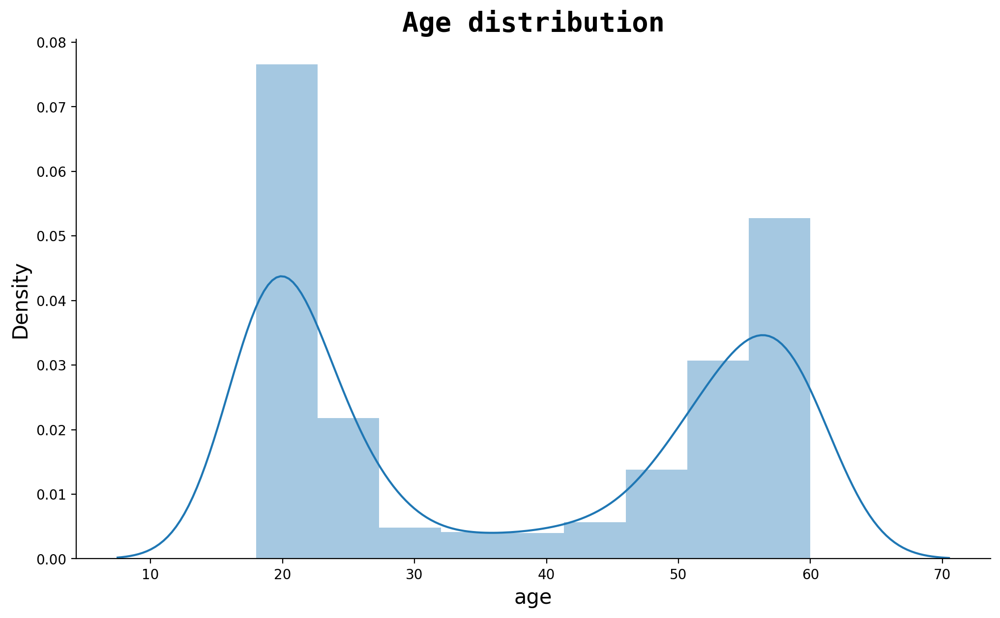

In [106]:
fig, ax = plt.subplots(figsize=(12, 7))
ax.set_title('Age distribution', fontweight='bold', fontsize = 20, fontfamily='monospace')
sns.distplot(df.age, ax=ax, kde=True)
ax.set_xlabel('age', fontsize = 15)
ax.set_ylabel('Density', fontsize = 15);

상대적으로 중간 나이층의 분포가 적어보인다.   
-> 우리가 예측해야 할 클래스로 나눠서 다시 분포를 측정해보자

In [59]:
# 예측해야 할 클래스로 나누기: 기범님 자료 참고 

def get_age_range(age):
    if age < 30:
        return "< 30"
    elif age >= 30 and age < 60:
        return ">= 30 and < 60"
    elif age >= 60:
        return ">= 60"

df['age_range'] = df['age'].progress_apply(lambda x : get_age_range(x))
df.age_range

100%|██████████| 2700/2700 [00:00<00:00, 569734.91it/s]


0       >= 30 and < 60
1       >= 30 and < 60
2       >= 30 and < 60
3       >= 30 and < 60
4       >= 30 and < 60
             ...      
2695              < 30
2696              < 30
2697              < 30
2698              < 30
2699              < 30
Name: age_range, Length: 2700, dtype: object

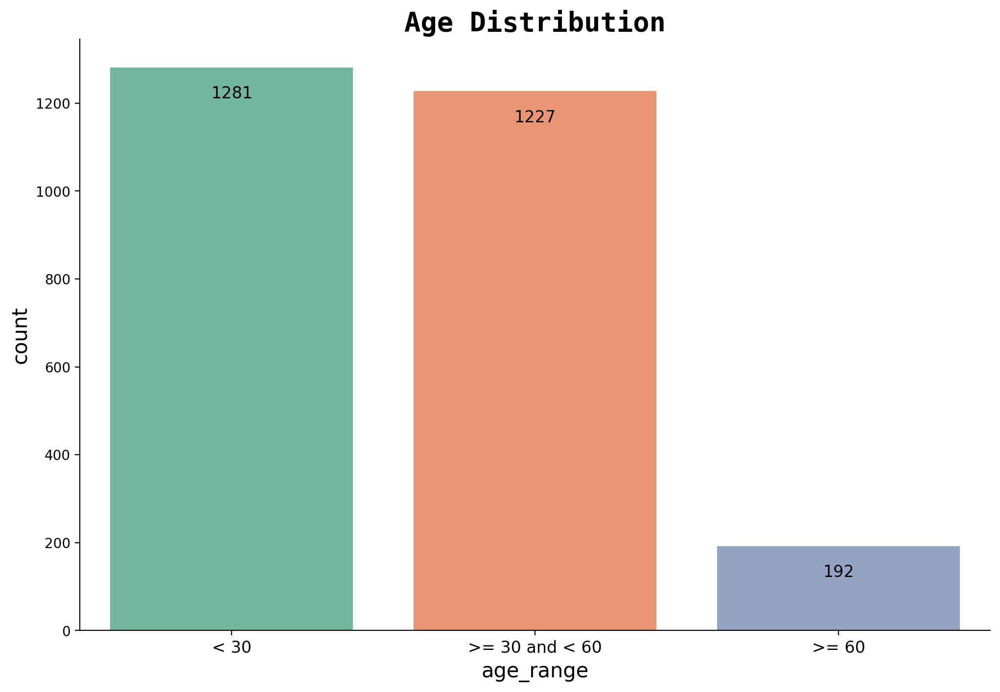

In [103]:
# 분포 그려보기
age_range_order = df.age_range.value_counts().sort_values(ascending = False)

fig, ax = plt.subplots(figsize = (12, 8))
ax.set_title('Age Distribution', fontweight='bold', fontsize = 20, fontfamily='monospace')
sns.countplot(x='age_range', data=df, order = age_range_order.index,
              palette='Set2', ax = ax)
ax.text(x=0 , y = age_range_order.values[0] - 70,
          s = age_range_order.values[0], 
          ha='center', fontsize = 12)
ax.text(x=1 , y = age_range_order.values[1] - 70,
         s = age_range_order.values[1], 
         ha='center', fontsize = 12)
ax.text(x=2 , y = age_range_order.values[2] - 70,
         s = age_range_order.values[2],
         ha='center', fontsize = 12)
ax.set_xticklabels(labels = ax.get_xticklabels(), fontsize = 12)
ax.set_xlabel('age_range', fontsize = 15)
ax.set_ylabel('count', fontsize = 15);


- 데이터 수: 나이 어린 사람 < 나이 중간 사람 < 나이 많은 사람
  - 나이 많은 사람들에 대한 데이터가 많이 부족한 것을 확인할 수 있음

### age-gender

''

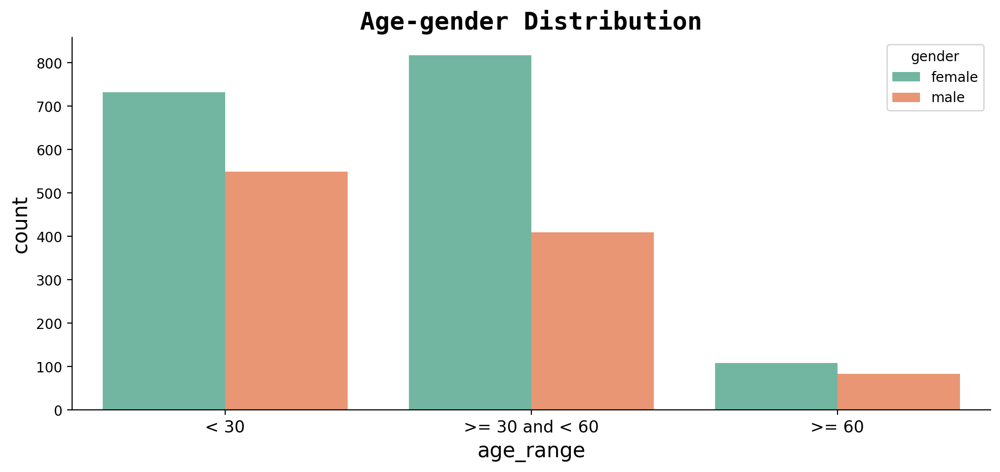

In [129]:
fig, ax = plt.subplots(1,1, figsize=(12, 5))
ax.set_title('Age-gender Distribution', fontweight='bold', fontsize = 18, fontfamily='monospace')
sns.countplot(x='age_range',data=df,
              hue='gender', palette='Set2', 
              order = df.age_range.value_counts().sort_index().index
             )
ax.set_xticklabels(labels = ax.get_xticklabels(), fontsize = 12)
ax.set_xlabel('age_range', fontsize = 15)
ax.set_ylabel('count', fontsize = 15)
;

여성의 경우, 나이 중간 사람들 > 나이 어린 사람들 > 나이 많은 사람들 순으로 데이터 수가 분포되어 있음  
남성의 경우, 나이 어린 사람들 > 나이 중간 사람들 > 나이 많은 사람들 순으로 데이터 수가 분포되어 있음  

-> 공통적으로 나이 많은 사람들에 대한 데이터가 현저히 부족 


## 전체 클래스에 대한 EDA

모든 클래스에 대한 분포를 알아보자

In [222]:
pred_class = pd.pivot_table(df, index = 'age_range', columns='gender', values='id', 
                aggfunc='count')
pred_class = pred_class[['male', 'female']].unstack()
pred_class

gender  age_range     
male    < 30              549
        >= 30 and < 60    410
        >= 60              83
female  < 30              732
        >= 30 and < 60    817
        >= 60             109
dtype: int64

In [223]:
pred_class = pd.concat([pred_class * 5, pred_class, pred_class])
pred_class

gender  age_range     
male    < 30              2745
        >= 30 and < 60    2050
        >= 60              415
female  < 30              3660
        >= 30 and < 60    4085
        >= 60              545
male    < 30               549
        >= 30 and < 60     410
        >= 60               83
female  < 30               732
        >= 30 and < 60     817
        >= 60              109
male    < 30               549
        >= 30 and < 60     410
        >= 60               83
female  < 30               732
        >= 30 and < 60     817
        >= 60              109
dtype: int64

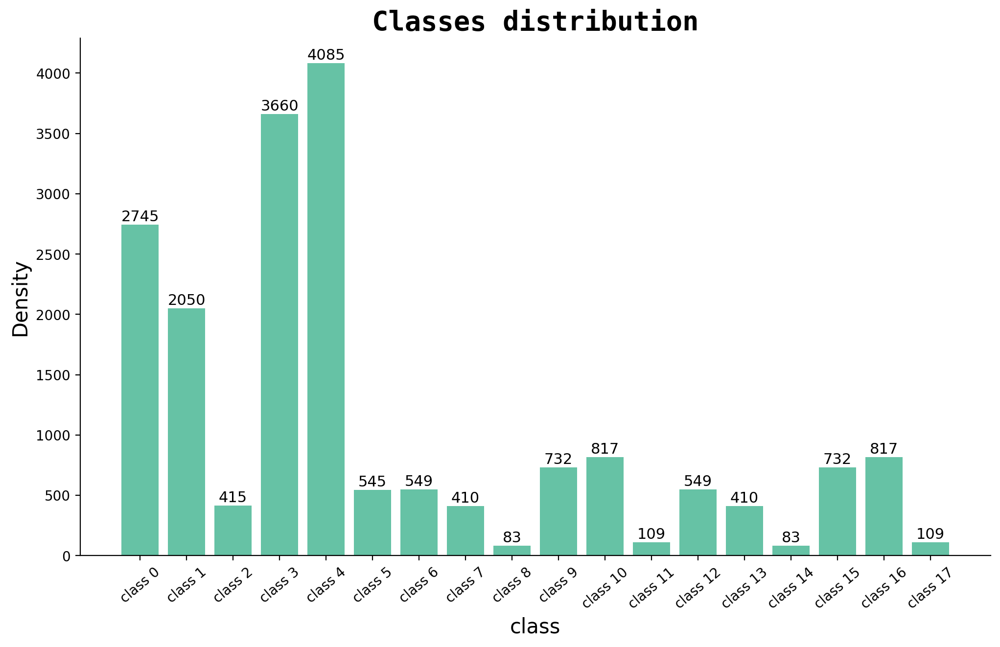

In [292]:
fig, ax = plt.subplots(figsize=(12, 7))
ax.set_title('Classes distribution', fontweight='bold', fontsize = 20, fontfamily='monospace')
ax.bar(['class ' + str(i) for i in range(18)], pred_class.values, color=sns.color_palette('Set2', 1))
plt.xticks(rotation =40)
for i in range(18):
    ax.text(x=i , y = pred_class.values[i] + 30,
              s = pred_class.values[i], 
              ha='center', fontsize = 11)
ax.set_xlabel('class', fontsize = 15)
ax.set_ylabel('Density', fontsize = 15);

- class{0, 1, 3, 4}에 데이터가 엄청나게 몰려
- class{8, 11, 14, 17}에 대한 데이터가 상대적으로 부족함을 알 수 있음